In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
import scipy.sparse as sp
from MulticoreTSNE import MulticoreTSNE as TSNE
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
wdir = "/Users/jakobmaeots/Internship/"
os.chdir( wdir )

loom_file = "Data/Velmeshev/Velmeshev_2019_matrix.loom"

# Open the loom file with loompy
ds = lp.connect(loom_file)

# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = "Data/Velmeshev/Velmeshev_1CTRL.loom"

# path to anndata object, which will be updated to store Scanpy results as they are generated below
f_anndata_path = "Data/Velmeshev/Velmeshev_1CTRL.h5ad"

# path to pyscenic output
f_pyscenic_output = "Data/Velmeshev/Velmeshev_1CTRL_SCENIC.loom"

# loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'Data/Velmeshev/Velmeshev_1CTRL_integrated-output.loom'

In [3]:
X = ds[:, :]

# Function to process attributes: try to squeeze to 1D; if not, skip the attribute
def process_attributes(attr_dict):
    new_attrs = {}
    for key in attr_dict.keys():
        try:
            arr = np.array(attr_dict[key])
            arr = np.squeeze(arr)
            if arr.ndim == 1:
                new_attrs[key] = arr
            else:
                print(f"Skipping attribute {key}: array is not 1D after squeezing (shape {arr.shape})")
        except Exception as e:
            print(f"Error processing attribute {key}: {e}")
    return new_attrs

In [4]:
# Process cell attributes (obs) and gene attributes (var)
obs_dict = process_attributes(ds.ca)
var_dict = process_attributes(ds.ra)

# Create DataFrames
obs = pd.DataFrame(obs_dict)
var = pd.DataFrame(var_dict)

# (Optional) If you expect specific keys (like "CellID" or "Gene") use them for index names.
# If these keys are missing or problematic, you can create simple indices.
if "CellID" in ds.ca.keys():
    obs.index = np.array(ds.ca["CellID"]).squeeze()
else:
    obs.index = [f"cell_{i}" for i in range(obs.shape[0])]

if "Gene" in ds.ra.keys():
    var.index = np.array(ds.ra["Gene"]).squeeze()
else:
    var.index = [f"gene_{i}" for i in range(var.shape[0])]

# Loom files are typically genes x cells.
# Scanpy’s AnnData expects the data matrix to be cells x genes.
# Also, if your matrix is large and sparse (which is common), convert it.
if not sp.issparse(X):
    print("Converting expression matrix to sparse CSR format")
    X = sp.csr_matrix(X)

Converting expression matrix to sparse CSR format


In [5]:
adata = sc.AnnData(X=X.T, obs=obs, var=var)
adata.var_names_make_unique()
# Close the loom file connection
ds.close()

# Verify the resulting AnnData object
print(adata)

AnnData object with n_obs × n_vars = 104559 × 65217
    obs: 'CT_ann_ABM_MCA_scmap_cell2cluster_51_CTs', 'CT_ann_score_ABM_MCA_scmap_cell2cluster_51_CTs', 'Capbatch', 'RNA Integrity Number', 'RNA mitochondr. percent', 'RNA ribosomal percent', 'Seqbatch', 'UMIs', 'age', 'batch', 'brain_region', 'cell', 'cell_id', 'cluster', 'condition', 'donor_id', 'genes', 'obs_names', 'post_mortem_interval', 'region', 'sample', 'sex', 'study_id'
    var: 'Gene', 'ensembl_id', 'gene_name', 'var_names'


/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/anndata/utils.py:268: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


In [6]:
unique_clusters = adata.obs['cluster'].unique()

# Print the unique study IDs
print("Unique clusters:", unique_clusters)

Unique clusters: ['Neu-NRGN-II' 'L5/6' 'Oligodendrocytes' 'OPC' 'AST-FB' 'Endothelial'
 'Microglia' 'Neu-NRGN-I' 'IN-VIP' 'L5/6-CC' 'IN-SV2C' 'L2/3' 'IN-PV' 'L4'
 'IN-SST' 'Neu-mat' 'AST-PP']


In [7]:
unique_donor_ids = adata.obs['donor_id'].unique()

# Print the unique study IDs
print("Donor study IDs:", unique_donor_ids)

Donor study IDs: ['Velmeshev_2019_1823' 'Velmeshev_2019_4341' 'Velmeshev_2019_4849'
 'Velmeshev_2019_4899' 'Velmeshev_2019_5144' 'Velmeshev_2019_5163'
 'Velmeshev_2019_5242' 'Velmeshev_2019_5278' 'Velmeshev_2019_5294'
 'Velmeshev_2019_5387' 'Velmeshev_2019_5391' 'Velmeshev_2019_5403'
 'Velmeshev_2019_5408' 'Velmeshev_2019_5419' 'Velmeshev_2019_5531'
 'Velmeshev_2019_5538' 'Velmeshev_2019_5554' 'Velmeshev_2019_5565'
 'Velmeshev_2019_5577' 'Velmeshev_2019_5841' 'Velmeshev_2019_5864'
 'Velmeshev_2019_5879' 'Velmeshev_2019_5893' 'Velmeshev_2019_5936'
 'Velmeshev_2019_5939' 'Velmeshev_2019_5945' 'Velmeshev_2019_5958'
 'Velmeshev_2019_5976' 'Velmeshev_2019_5978' 'Velmeshev_2019_6032'
 'Velmeshev_2019_6033']


In [8]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

/var/folders/3n/bg3b1qfs4jz9hnh_q29xp5k00000gn/T/ipykernel_42867/1167869884.py:2: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


In [9]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 20

In [10]:
nCountsPerGene = np.sum(adata.X, axis=0)
nCellsPerGene = np.sum(adata.X>0, axis=0)

# Show info
print("Number of counts (in the dataset units) per gene:", nCountsPerGene.min(), " - " ,nCountsPerGene.max())
print("Number of cells in which each gene is detected:", nCellsPerGene.min(), " - " ,nCellsPerGene.max())

Number of counts (in the dataset units) per gene: 0.0  -  32212542.0
Number of cells in which each gene is detected: 0  -  104067


In [11]:
nCells=adata.X.shape[0]

# pySCENIC thresholds
minCountsPerGene=3*.01*nCells # 3 counts in 1% of cells
print("minCountsPerGene: ", minCountsPerGene)

minSamples=.01*nCells # 1% of cells
print("minSamples: ", minSamples)

minCountsPerGene:  3136.77
minSamples:  1045.59


In [12]:
# Define the patient IDs and cell type you want to keep
control_id = "Velmeshev_2019_5577"

# Filter the dataset to include only cells from these two patient IDs and the specified cell type
adata = adata[(adata.obs['donor_id'].isin([ control_id]))]

# Verify the filtering
print(f"Number of cells after filtering: {adata.n_obs}")
print(f"Unique study IDs after filtering: {adata.obs['donor_id'].unique()}")

Number of cells after filtering: 4131
Unique study IDs after filtering: ['Velmeshev_2019_5577']


In [13]:
# Simply compute the number of genes per cell
sc.pp.filter_cells(adata, min_genes=0)

# Identify mitochondrial genes, assuming gene names starting with 'MT-'
mito_genes = adata.var_names.str.startswith('MT-')

# Compute the sum of counts in mitochondrial genes for each cell
mito_sum = np.array(adata[:, mito_genes].X.sum(axis=1)).flatten()

# Compute the total counts per cell
total_sum = np.array(adata.X.sum(axis=1)).flatten()

# Compute percent mitochondrial and add total counts to adata.obs
adata.obs['percent_mito'] = mito_sum / total_sum
adata.obs['n_counts'] = total_sum

/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:170: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


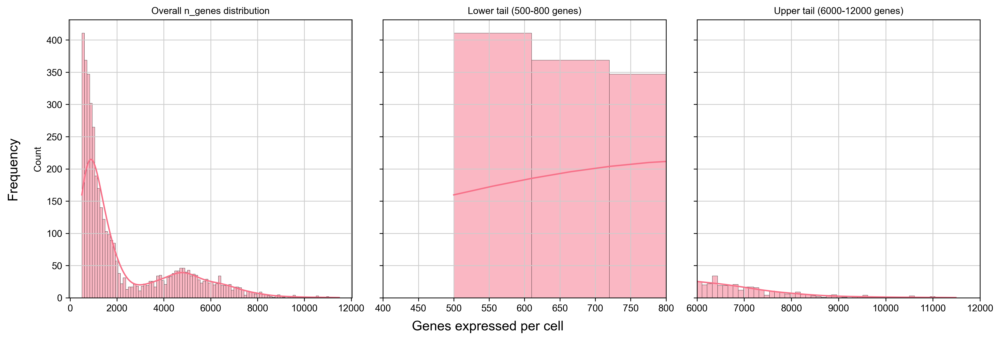

In [14]:
# Set the color palette
sns.set_palette("husl")

# Use the n_genes column from your AnnData object
x = adata.obs['n_genes']

# Define the number of bins for the histogram
nbins = 100

# Create subplots: overall distribution, lower tail, and upper tail
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi=150, sharey=True)

# Overall n_genes distribution
sns.histplot(x, ax=ax1, bins=nbins, kde=True)
ax1.set_title('Overall n_genes distribution')

# Lower tail: limit x-axis from 500 to 800
sns.histplot(x, ax=ax2, bins=nbins, kde=True)
ax2.set_xlim(400, 800)
ax2.set_title('Lower tail (500-800 genes)')

# Upper tail: limit x-axis from 6000 to 12000
sns.histplot(x, ax=ax3, bins=nbins, kde=True)
ax3.set_xlim(6000, 12000)
ax3.set_title('Upper tail (6000-12000 genes)')

# Remove individual x-axis labels (use global x-label instead)
for ax in (ax1, ax2, ax3):
    ax.set_xlabel('')

# Add a common y-axis label for Frequency
fig.text(0.04, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', fontsize=14)

# Add a common x-axis label for Genes expressed per cell
fig.text(0.5, 0.04, 'Genes expressed per cell', ha='center', va='center', fontsize=14)

# Adjust layout to minimize overlap
fig.tight_layout(rect=[0.05, 0.05, 1, 1])

plt.show()

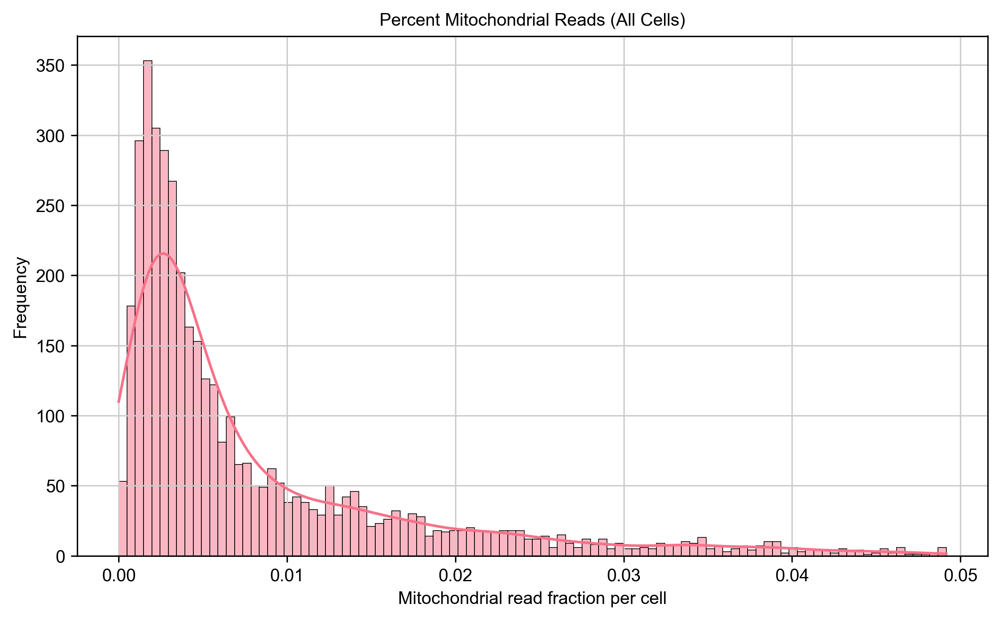

In [15]:
# Set the color palette (optional)
sns.set_palette("husl")

# Extract your data
x = adata.obs['percent_mito']
nbins = 100

# Create a single plot
fig, ax = plt.subplots(figsize=(8, 5), dpi=150)
sns.histplot(x, ax=ax, bins=nbins, kde=True)
ax.set_title("Percent Mitochondrial Reads (All Cells)")
ax.set_xlabel("Mitochondrial read fraction per cell")
ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

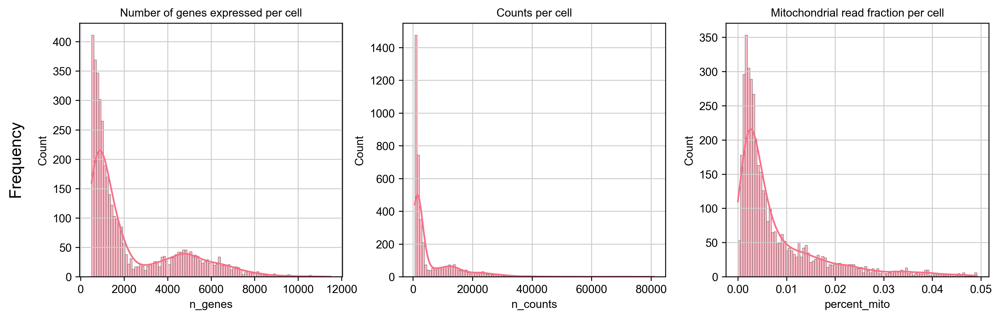

In [16]:
# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)

# Plot histograms with kernel density estimates
sns.histplot(adata.obs['n_genes'], ax=ax1, bins=100, kde=True)
sns.histplot(adata.obs['n_counts'], ax=ax2, bins=100, kde=True)
sns.histplot(adata.obs['percent_mito'], ax=ax3, bins=100, kde=True)

# Set titles
ax1.set_title('Number of genes expressed per cell')
ax2.set_title('Counts per cell')
ax3.set_title('Mitochondrial read fraction per cell')

# Set y-axis label
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

# Adjust layout
fig.tight_layout()

# Save the figure
fig.savefig('filtering_panel_prefilter_Velmeshev_1CTRL.pdf', dpi=600, bbox_inches='tight')

/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:921: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g: sns.axisgrid.FacetGrid = sns.catplot(


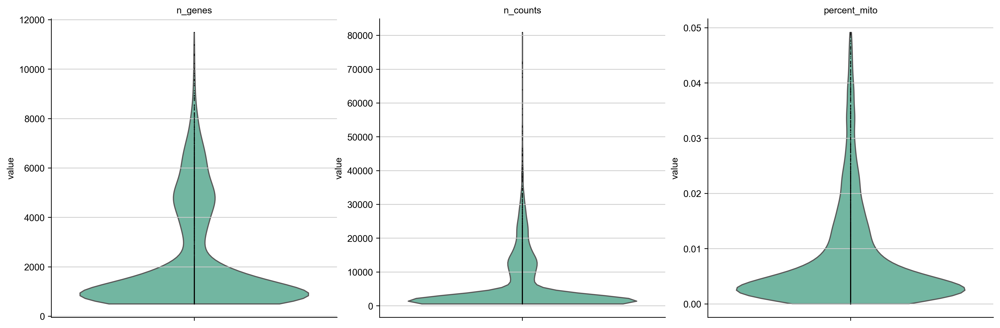

In [17]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
    jitter=0, multi_panel=True, palette="Set2")

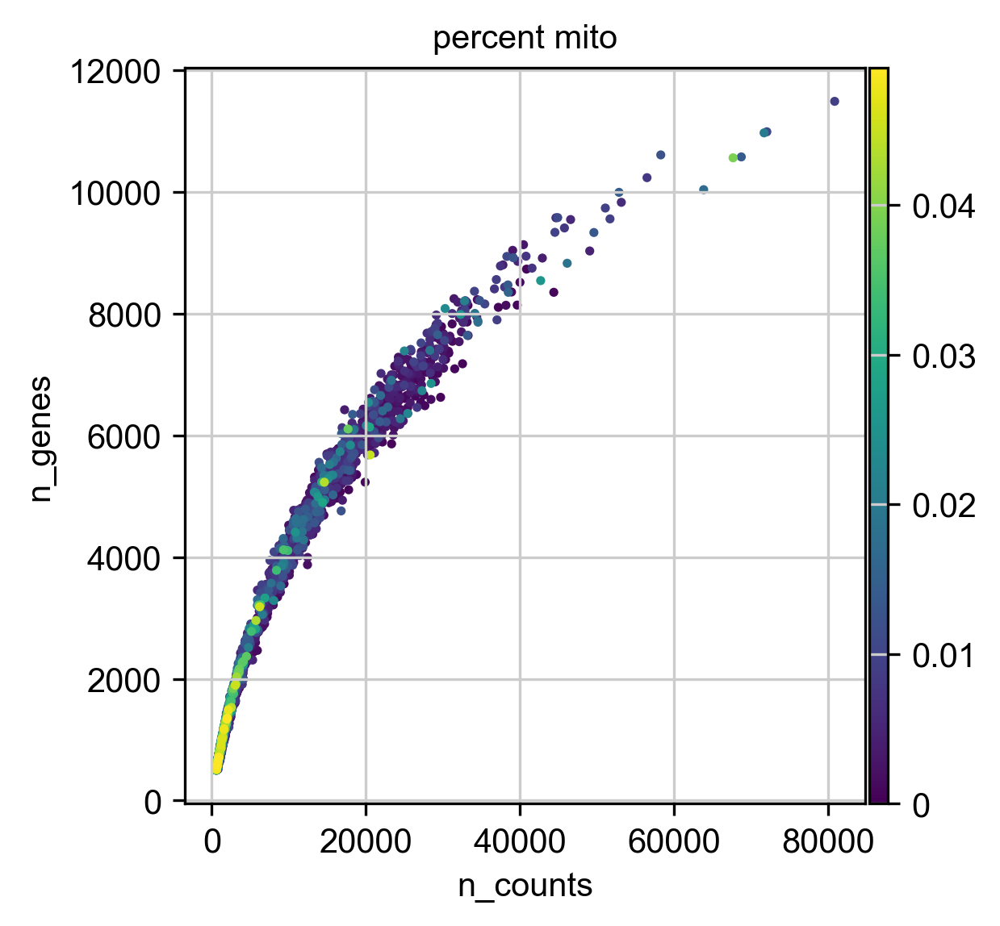

In [18]:
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='percent_mito')

In [19]:
sc.pp.filter_cells(adata, min_genes=500 )
sc.pp.filter_genes(adata, min_cells=3 )

filtered out 36653 genes that are detected in less than 3 cells


In [20]:
adata = adata[adata.obs['n_genes'] < 8000, :]

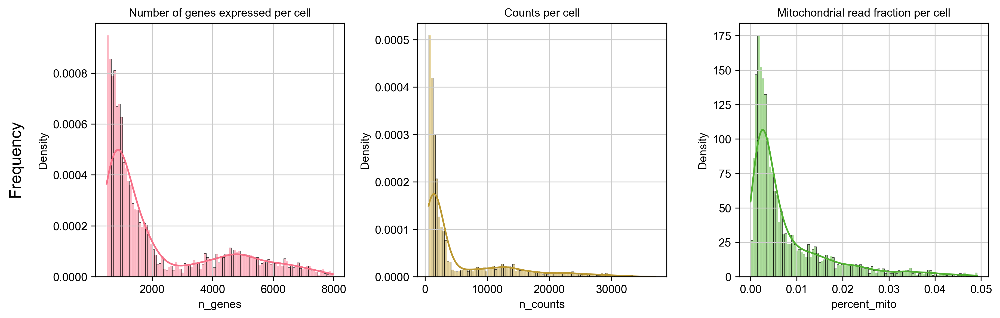

In [21]:
# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)

# Plot histograms with kernel density estimates
sns.histplot(adata.obs['n_genes'], ax=ax1, bins=100, kde=True, color=sns.color_palette("husl")[0], stat="density")
sns.histplot(adata.obs['n_counts'], ax=ax2, bins=100, kde=True, color=sns.color_palette("husl")[1], stat="density")
sns.histplot(adata.obs['percent_mito'], ax=ax3, bins=100, kde=True, color=sns.color_palette("husl")[2], stat="density")

# Set titles
ax1.set_title('Number of genes expressed per cell')
ax2.set_title('Counts per cell')
ax3.set_title('Mitochondrial read fraction per cell')

# Set y-axis label
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

# Adjust layout
fig.tight_layout()

# Save the figure
fig.savefig('filtering_panel_postfilter_Velmeshev_1CTRL.pdf', dpi=600, bbox_inches='tight')

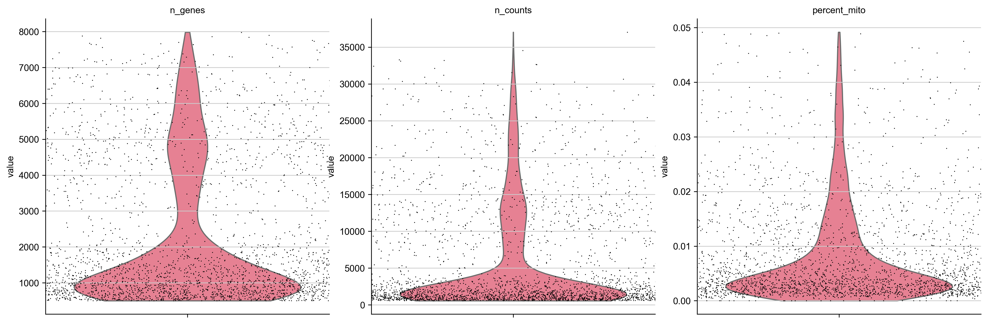

In [22]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
    jitter=0.8, multi_panel=True )

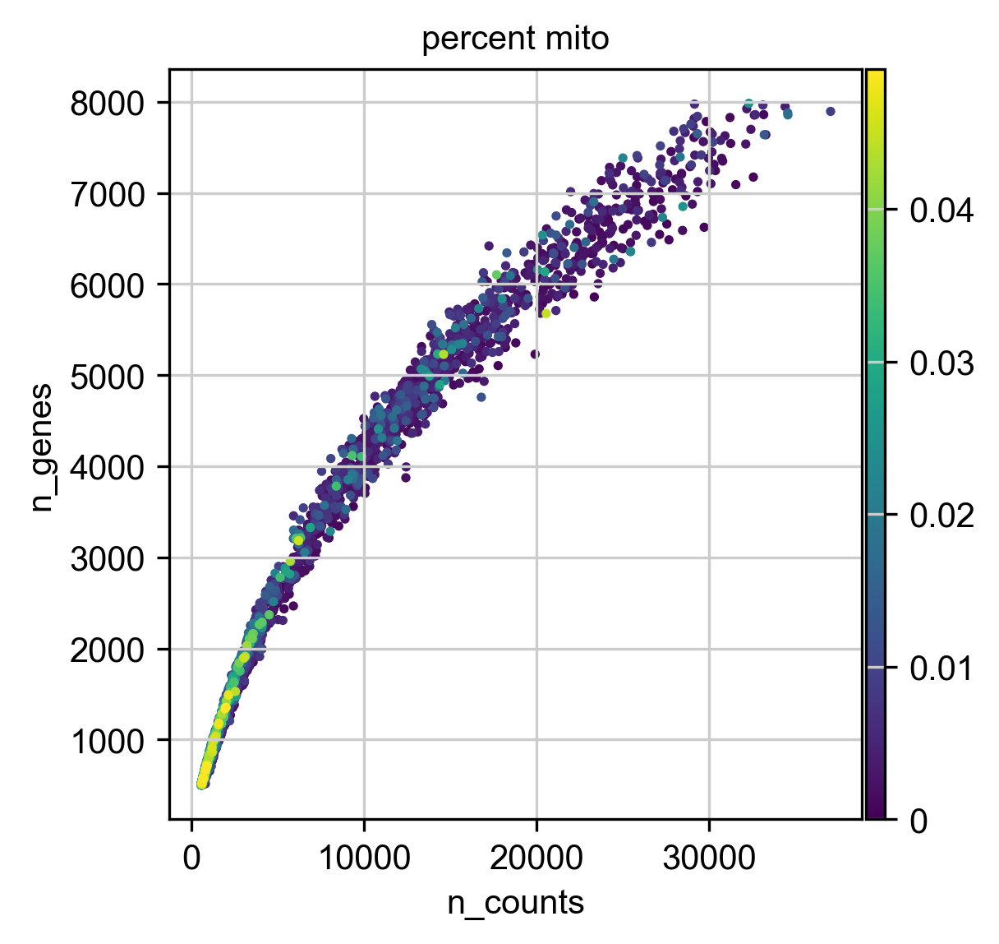

In [23]:
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='percent_mito')

In [24]:
adata.write( f_anndata_path )

In [25]:
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(adata.var_names) ,
}
col_attrs = {
    "CellID": np.array(adata.obs_names) ,
    "nGene": np.array( np.sum(adata.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(adata.X.transpose() , axis=0)).flatten() ,
}
lp.create( f_loom_path_scenic, adata.X.transpose(), row_attrs, col_attrs)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes


/var/folders/3n/bg3b1qfs4jz9hnh_q29xp5k00000gn/T/ipykernel_42867/3186822170.py:5: FutureWarning: Use sc.pp.normalize_total instead
  sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:589: FutureWarning: Use sc.pp.normalize_total instead
  normalize_per_cell(


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


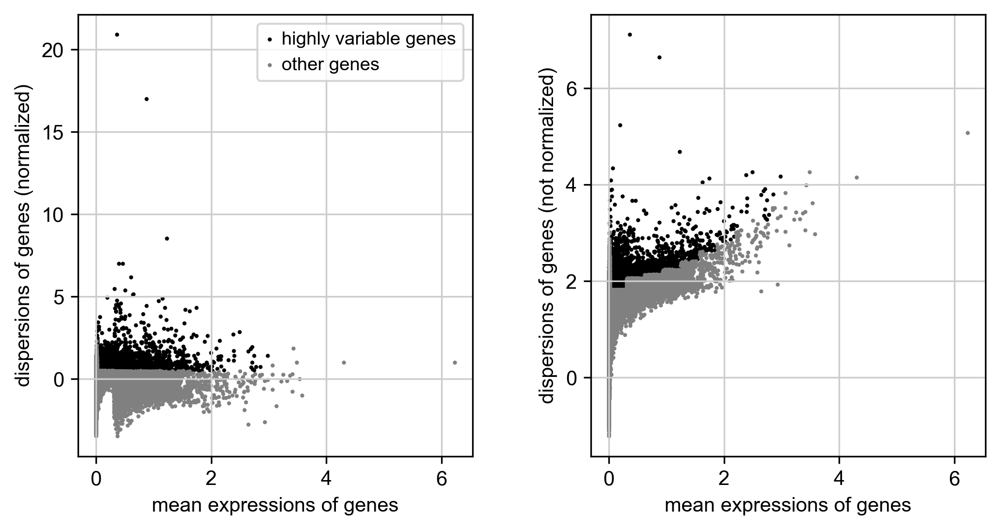

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:00)


/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:710: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [26]:
# save a copy of the raw data
adata.raw = adata

# Total-count normalize (library-size correct) to 10,000 reads/cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# log transform the data.
sc.pp.log1p(adata)

# identify highly variable genes.
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

# keep only highly variable genes:
adata = adata[:, adata.var['highly_variable']]

# regress out total counts per cell and the percentage of mitochondrial genes expressed
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'] ) #, n_jobs=args.threads)

# scale each gene to unit variance, clip values exceeding SD 10.
sc.pp.scale(adata, max_value=10)

# update the anndata file:
adata.write( f_anndata_path )

computing PCA
    with n_comps=50
    finished (0:00:03)


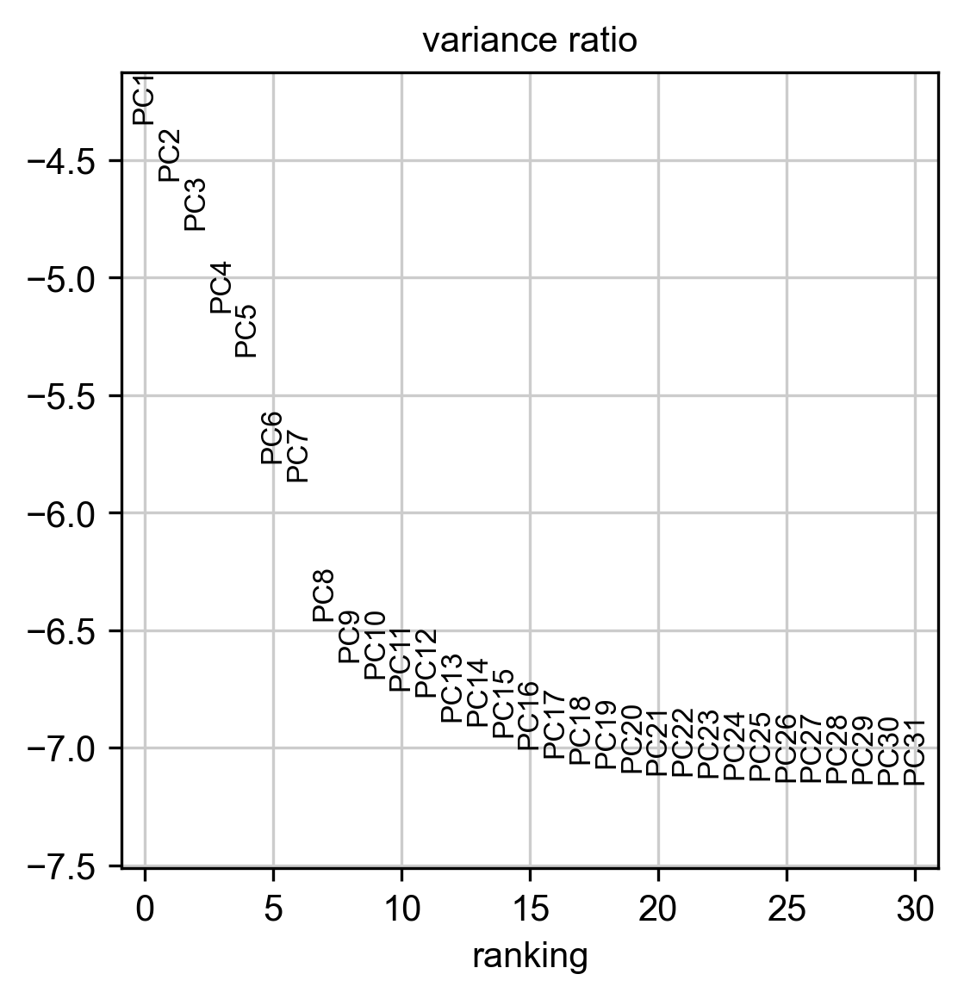

In [27]:
# adata = sc.read_h5ad( f_anndata_path )
# principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)
adata.write( f_anndata_path )

In [28]:
# neighborhood graph of cells (determine optimal number of PCs here)
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
# compute UMAP
sc.tl.umap(adata)
# tSNE
tsne = TSNE( n_jobs=20 )
adata.obsm['X_tsne'] = tsne.fit_transform( adata.X )
adata.write( f_anndata_path )

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


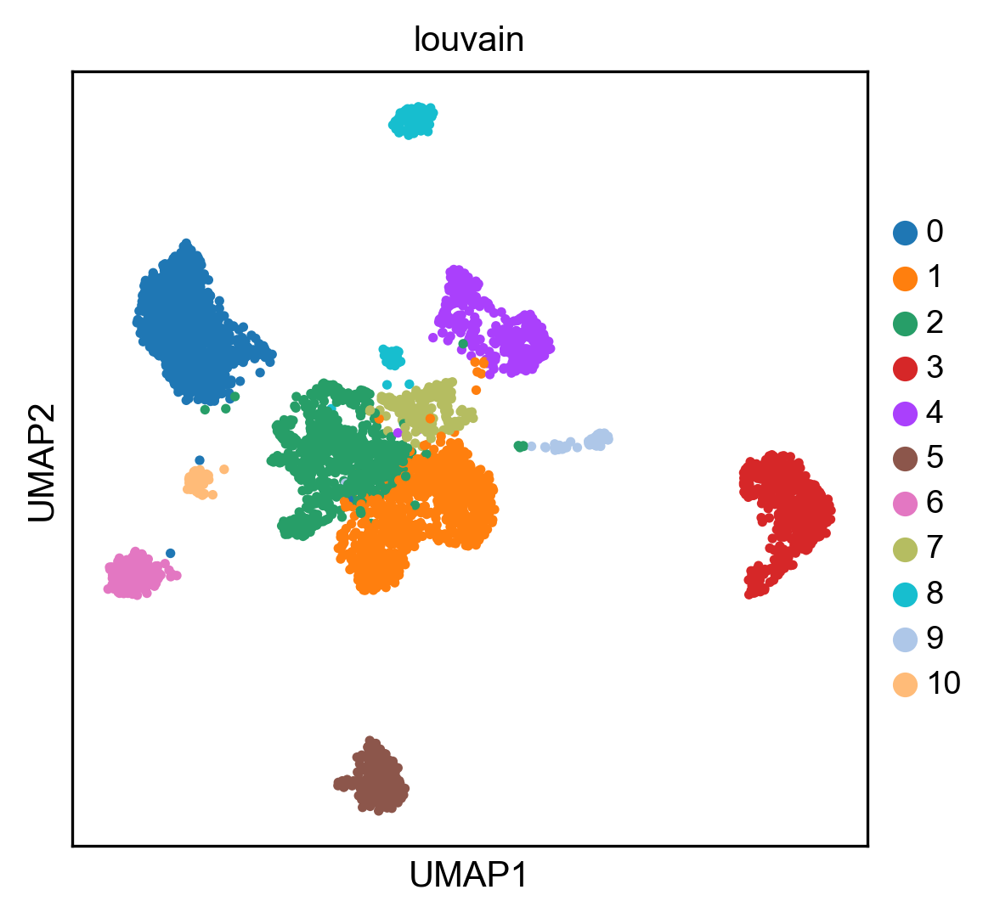

In [29]:
# cluster the neighbourhood graph
sc.tl.louvain(adata,resolution=0.4)

sc.pl.umap(adata, color=['louvain'] )

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


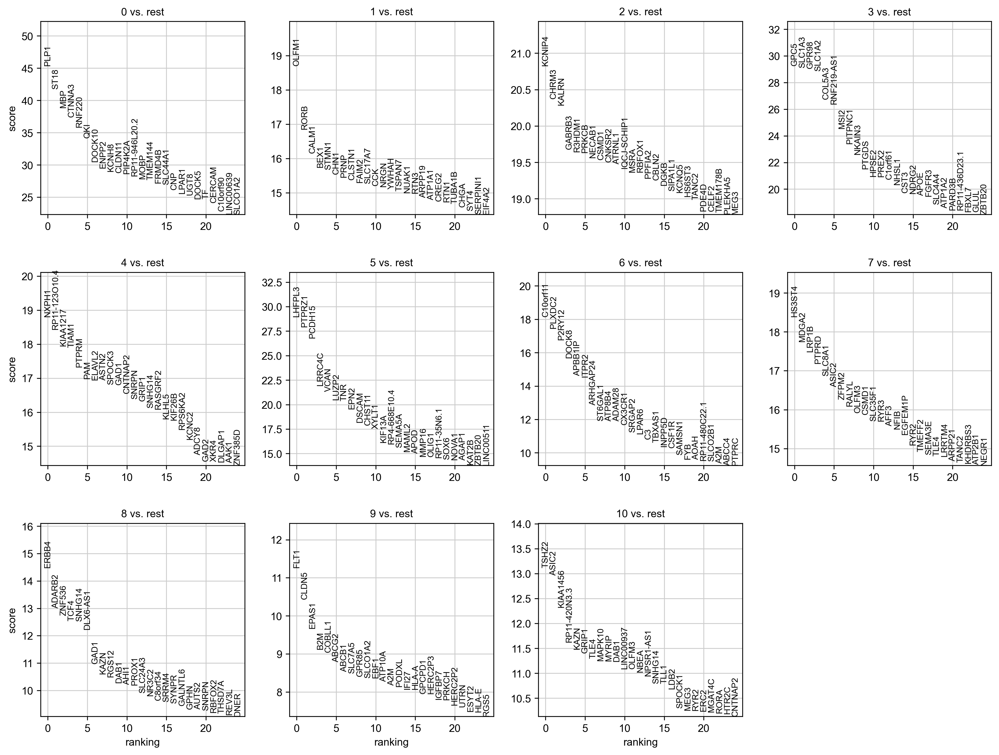

In [30]:
# find marker genes
sc.tl.rank_genes_groups(adata, 'louvain', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# sc.tl.rank_genes_groups(adata, 'louvain', method='logreg')
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)
adata.write( f_anndata_path )

In [31]:
## Docker regulatory inference
#docker run -it -v /Users/jakobmaeots/Internship/Data:/data \
#aertslab/pyscenic:0.11.0 \
#pyscenic grn \
#--num_workers 2 \ 
#--output /data/-----adj.tsv \
#--method grnboost2 \
#/data/----------.loom \
#/data/allTFs_hg38.txt #worked

#docker run -it --rm \
    #-v /Users/jakobmaeots/Internship/Data:/data \
   # aertslab/pyscenic:0.12.0 \
    #pyscenic ctx \
    #/data/-------adj.tsv \
    #/data/hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather \
    #--annotations_fname /data/motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl \
    #--expression_mtx_fname /data/-----------.loom \
    #--mode "dask_multiprocessing" \
    #--output /data/-----reg.csv \
    #--num_workers 3 \
    #--mask_dropouts #worked

#docker run -it --rm \
    #-v /Users/jakobmaeots/Internship/Data:/data \
    #aertslab/pyscenic:0.12.0 \
    #pyscenic aucell \
    #/data/-------------.loom\
    #/data/----------.csv\
    #--output /data/--------_SCENIC.loom\
    #--num_workers 3 #worked

In [32]:
import json
import zlib
import base64

# collect SCENIC AUCell output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()

In [33]:
import umap

# UMAP
runUmap = umap.UMAP(n_neighbors=10, min_dist=0.4, metric='correlation').fit_transform
dr_umap = runUmap( auc_mtx )
pd.DataFrame(dr_umap, columns=['X', 'Y'], index=auc_mtx.index).to_csv( "scenic_umap.txt", sep='\t')
# tSNE
tsne = TSNE( n_jobs=20 )
dr_tsne = tsne.fit_transform( auc_mtx )
pd.DataFrame(dr_tsne, columns=['X', 'Y'], index=auc_mtx.index).to_csv( "scenic_tsne.txt", sep='\t')

In [34]:
# scenic output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )
dr_tsne = pd.read_csv( 'scenic_tsne.txt', sep='\t', header=0, index_col=0 )
###

In [35]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

In [36]:
tsneDF = pd.DataFrame(adata.obsm['X_tsne'], columns=['_X', '_Y'])

Embeddings_X = pd.DataFrame( index=lf.ca.CellID )
Embeddings_X = pd.concat( [
        pd.DataFrame(adata.obsm['X_umap'],index=adata.obs.index)[0] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[0] ,
        dr_tsne['X'] ,
        dr_umap['X']
    ], sort=False, axis=1, join='outer' )
Embeddings_X.columns = ['1','2','3','4']

Embeddings_Y = pd.DataFrame( index=lf.ca.CellID )
Embeddings_Y = pd.concat( [
        pd.DataFrame(adata.obsm['X_umap'],index=adata.obs.index)[1] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[1] ,
        dr_tsne['Y'] ,
        dr_umap['Y']
    ], sort=False, axis=1, join='outer' )
Embeddings_Y.columns = ['1','2','3','4']

In [37]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": -1,
        "name": f"Scanpy t-SNE (highly variable genes)"
    },
    {
        "id": 1,
        "name": f"Scanpy UMAP  (highly variable genes)"
    },
    {
        "id": 2,
        "name": "Scanpy PC1/PC2"
    },
    {
        "id": 3,
        "name": "SCENIC AUC t-SNE"
    },
    {
        "id": 4,
        "name": "SCENIC AUC UMAP"
    },
]

metaJson["clusterings"] = [{
            "id": 0,
            "group": "Scanpy",
            "name": "Scanpy louvain default resolution",
            "clusters": [],
        }]

metaJson["metrics"] = [
        {
            "name": "nUMI"
        }, {
            "name": "nGene"
        }, {
            "name": "Percent_mito"
        }
]

metaJson["annotations"] = [
    {
        "name": "Louvain_clusters_Scanpy",
        "values": list(set( adata.obs['louvain'].astype(str) ))
    },
    #{
    #    "name": "Genotype",
    #    "values": list(set(adata.obs['Genotype'].values))
    #},
    #{
    #    "name": "Timepoint",
    #    "values": list(set(adata.obs['Timepoint'].values))
    #},
    #{
    #    "name": "Sample",
    #    "values": list(set(adata.obs['Sample'].values))
    #}
]

# SCENIC regulon thresholds:
metaJson["regulonThresholds"] = rt

for i in range(max(set([int(x) for x in adata.obs['louvain']])) + 1):
    clustDict = {}
    clustDict['id'] = i
    clustDict['description'] = f'Unannotated Cluster {i + 1}'
    metaJson['clusterings'][0]['clusters'].append(clustDict)
    
clusterings = pd.DataFrame()
clusterings["0"] = adata.obs['louvain'].values.astype(np.int64)

In [38]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [39]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
    "nUMI": np.array(adata.obs['n_counts'].values),
    "nGene": np.array(adata.obs['n_genes'].values),
    "Louvain_clusters_Scanpy": np.array( adata.obs['louvain'].values ),
    #"Genotype": np.array(adata.obs['Genotype'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
    "Percent_mito": np.array(adata.obs['percent_mito'].values),
    "Embedding": dfToNamedMatrix(tsneDF),
    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
    "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
    "Clusterings": dfToNamedMatrix(clusterings),
    "ClusterID": np.array(adata.obs['louvain'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [40]:
lp.create(
    filename = f_final_loom ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

In [56]:
# Assuming adata is your AnnData object
# Create a new column with the 'cell_' prefix
adata.obs['cell_id'] = 'cell_' + adata.obs['obs_names'].astype(str)

# Select the columns to save
data_to_save = adata.obs[['cell_id', 'cluster']]

# Save as a .tsv file
tsv_file_path = '/Users/jakobmaeots/Internship/Data/Velmeshev/CTRL_cell_cluster_identifiers.tsv'
data_to_save.to_csv(tsv_file_path, sep='\t', index=False)

# Save as a .csv file
csv_file_path = '/Users/jakobmaeots/Internship/Data/Velmeshev/CTRL_cell_cluster_identifiers.csv'
data_to_save.to_csv(csv_file_path, index=False)

print(f"Data saved to {tsv_file_path} and {csv_file_path}")

Data saved to cell_cluster_identifiers.tsv and cell_cluster_identifiers.csv


In [4]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

/var/folders/3n/bg3b1qfs4jz9hnh_q29xp5k00000gn/T/ipykernel_19699/2005550902.py:2: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


In [6]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [7]:
# Create a DataFrame from the regulons data
regulons_df = pd.DataFrame(lf.ra.Regulons, index=lf.ra.Gene)

# Create a dictionary of regulons
regulons = {}
for index, row in regulons_df.iterrows():
    # Assuming the regulon data is binary (1 or 0)
    regulons[index] = list(row[row == 1].index.values)

# Now `regulons` is a dictionary where keys are gene names and values are lists of regulons

In [8]:
print(lf.ca.keys())

['CellID', 'ClusterID', 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'Louvain_clusters_Scanpy', 'Percent_mito', 'RegulonsAUC', 'nGene', 'nUMI']


In [9]:
# cell annotations from the loom column attributes:
cellAnnot = pd.concat(
    [
        pd.DataFrame( lf.ca.Clusterings, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Louvain_clusters_Scanpy, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Percent_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
 'Clusterings',
 'ClusterID',
 'Louvain_clusters_Scanpy',
 'Percent_mito',
 'nGene',
 'nUMI']

In [10]:
# capture embeddings:
dr = [
    pd.DataFrame( lf.ca.Embedding, index=lf.ca.CellID )
]
dr_names = [
    meta['embeddings'][0]['name'].replace(" ","_")
]

# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [11]:
lf.close()

In [12]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "https://motifcollections.aertslab.org/v10nr_clust/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [41]:
df_motifs = load_motifs('Data/Velmeshev/1CTRLreg.csv')

In [42]:
print(df_motifs.head())

                                          Enrichment            \
                                                 AUC       NES   
TF    MotifID                                                    
ATF3  tfdimers__MD00424                     0.062732  3.173859   
ATF4  taipale_tf_pairs__JUN_ATGACGTCAT_HT   0.045077  3.824882   
      metacluster_180.3                     0.041098  3.000634   
      transfac_pro__M00801                  0.041875  3.161556   
BACH1 tfdimers__MD00569                     0.074329  3.483718   

                                                                 \
                                          MotifSimilarityQvalue   
TF    MotifID                                                     
ATF3  tfdimers__MD00424                            2.033250e-08   
ATF4  taipale_tf_pairs__JUN_ATGACGTCAT_HT          9.184570e-08   
      metacluster_180.3                            0.000000e+00   
      transfac_pro__M00801                         0.000000e+00   
BA

In [43]:
selected_motifs = ['BCL11A','CUX1', 'AHDC1']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [44]:
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [45]:
adata = sc.read( f_final_loom, validate=False)

sc.set_figure_params(frameon=False, dpi=600, fontsize=10, dpi_save=600)

sc.pl.scatter( adata, basis='highly_variable_genes_UMAP', 
    color=['Louvain_clusters_Scanpy','Clusterings'],
    title=['HVG - UMAP (Louvain clusters)','HVG - UMAP (Cell type)'],
    alpha=0.8,
    save='_Louvain-celltype2.pdf'
    )

sc.pl.scatter( adata, basis='SCENIC_AUC_UMAP', 
    color=['Louvain_clusters_Scanpy','Clusterings'],
    title=['SCENIC - UMAP (Louvain clusters)','SCENIC - UMAP (Cell type)'], 
    alpha=0.8,
    save='_Louvain-celltype2.pdf'
    )

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


KeyError: 'compute coordinates using visualization tool highly_variable_genes_UMAP first'

In [46]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

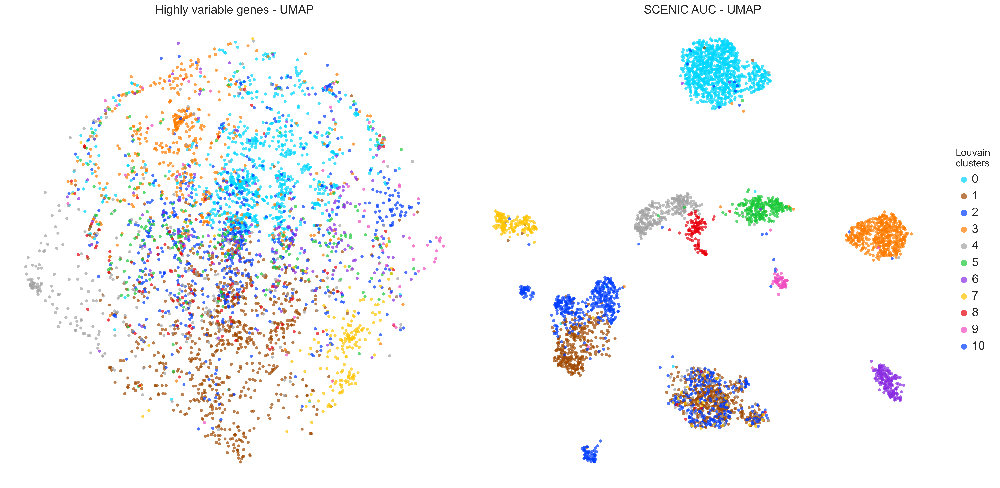

In [47]:
plt.rcParams.update({'font.size': 12})

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), dpi=150)

# Plot using drplot without specifying 's'
drplot(dr[0], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax1, palette='bright', title='Highly variable genes - UMAP')
drplot(dr[4], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax2, palette='bright', title='SCENIC AUC - UMAP')

# Adjust dot size using Matplotlib's scatter method
for ax in [ax1, ax2]:
    for collection in ax.collections:
        collection.set_sizes([20])  # Set the size of the dots; adjust the value as needed

ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

plt.tight_layout()
# plt.savefig("1CTRL_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches="tight")
plt.show()

In [48]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
from pyscenic.binarization import binarize

In [49]:
from math import sqrt
import numpy as np
import pandas as pd
from scipy.spatial.distance import jensenshannon

def regulon_specificity_scores(auc_mtx, cell_type_series):
    """
    Calculates the Regulon Specificity Scores (RSS).

    :param auc_mtx: DataFrame with AUC values for all cells and regulons (n_cells x n_regulons).
    :param cell_type_series: Pandas Series with cell identifiers as index and cell type labels as values.
    :return: DataFrame with RSS values (cell type x regulon).
    """
    # Get unique cell types
    cell_types = list(cell_type_series.unique())
    n_types = len(cell_types)

    # Get regulons from the AUC matrix
    regulons = list(auc_mtx.columns)
    n_regulons = len(regulons)

    # Initialize the RSS values array
    rss_values = np.empty(shape=(n_types, n_regulons), dtype=float)

    def rss(aucs, labels):
        # Calculate RSS using Jensen-Shannon divergence
        return 1.0 - jensenshannon(aucs / aucs.sum(), labels / labels.sum())

    # Calculate RSS for each regulon and cell type
    for cidx, regulon_name in enumerate(regulons):
        for ridx, cell_type in enumerate(cell_types):
            aucs = auc_mtx[regulon_name].values
            labels = (cell_type_series == cell_type).astype(int)
            rss_values[ridx, cidx] = rss(aucs, labels)

    # Return the RSS values as a DataFrame
    return pd.DataFrame(data=rss_values, index=cell_types, columns=regulons)

In [50]:
rss_cellType = regulon_specificity_scores( auc_mtx, cellAnnot['Clusterings'] )
rss_cellType

,ALX3(+),AR(+),ARID3A(+),ARNT2(+),ATF3(+),ATF4(+),BACH1(+),BCL6(+),BHLHE22(+),BPTF(+),...,ZNF44(+),ZNF571(+),ZNF582(+),ZNF613(+),ZNF672(+),ZNF777(+),ZNF85(+),ZSCAN1(+),ZSCAN21(+),ZSCAN31(+)
4,0.180171,0.196911,0.268414,0.311949,0.218279,0.247573,0.307421,0.238171,0.210756,0.219037,...,0.211564,0.188028,0.220660,0.210131,0.206043,0.233589,0.188128,0.218802,0.250202,0.208338
0,0.208365,0.473716,0.414304,0.304865,0.524804,0.348307,0.367548,0.370602,0.261387,0.409044,...,0.301150,0.257670,0.528729,0.492621,0.317576,0.397958,0.204363,0.287267,0.299007,0.360985
3,0.265053,0.287432,0.259647,0.242567,0.285417,0.268835,0.287392,0.401175,0.254142,0.267853,...,0.284814,0.358664,0.293808,0.291374,0.273459,0.298318,0.219865,0.250812,0.274917,0.266719
9,0.203807,0.185861,0.200917,0.182055,0.178739,0.193994,0.191991,0.199724,0.182817,0.207726,...,0.191584,0.188965,0.197438,0.190778,0.197623,0.191271,0.189705,0.194279,0.206912,0.204340
2,0.196888,0.245143,0.301467,0.350613,0.243605,0.320277,0.304721,0.241851,0.260004,0.273612,...,0.243829,0.198675,0.249555,0.225446,0.249014,0.276879,0.191620,0.248799,0.243627,0.262814
8,0.181452,0.182098,0.217124,0.231194,0.194401,0.199200,0.226314,0.190324,0.186721,0.192797,...,0.183099,0.174947,0.187896,0.185330,0.187044,0.213690,0.188542,0.198738,0.212532,0.189887
5,0.203631,0.201687,0.245672,0.266653,0.245782,0.223765,0.259364,0.250994,0.203953,0.225568,...,0.254582,0.202081,0.225493,0.243617,0.226941,0.275975,0.207008,0.229971,0.258666,0.212836
1,0.218635,0.308829,0.290311,0.322302,0.254695,0.410637,0.302643,0.263903,0.373381,0.244960,...,0.250921,0.210899,0.238234,0.257205,0.264635,0.281540,0.204928,0.278910,0.291175,0.295414
10,0.167445,0.174069,0.180112,0.190752,0.181789,0.181258,0.188675,0.179481,0.177944,0.179784,...,0.179173,0.168031,0.173285,0.174238,0.185302,0.189948,0.167445,0.174126,0.179658,0.177721
7,0.168483,0.200034,0.214365,0.226891,0.182912,0.216402,0.222927,0.182959,0.199904,0.214188,...,0.190740,0.186077,0.190893,0.183772,0.201114,0.212473,0.183339,0.194229,0.191567,0.209378


In [51]:
import matplotlib.pyplot as plt
from adjustText import adjust_text

# Define the categories
cats = sorted(list(set(cellAnnot['Clusterings'])))

# Create the figure with a layout that fits 11 panels
fig = plt.figure(figsize=(18, 12))  # Adjust the figure size as needed

# Determine the number of rows and columns needed
n_panels = len(cats)
ncols = 4  # You can adjust this based on your preference
nrows = (n_panels + ncols - 1) // ncols  # Ceiling division to ensure enough rows

# Iterate over categories and create subplots
for c, num in zip(cats, range(1, n_panels + 1)):
    x = rss_cellType.T[c]
    ax = fig.add_subplot(nrows, ncols, num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim(x.min() - (x.max() - x.min()) * 0.05, x.max() + (x.max() - x.min()) * 0.05)

    # Set font size for texts
    for t in ax.texts:
        t.set_fontsize(12)

    # Remove axis labels
    ax.set_ylabel('')
    ax.set_xlabel('')

    # Adjust text to prevent overlap
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom',
                arrowprops=dict(arrowstyle='-', color='lightgrey'), precision=0.001)

# Set figure-wide labels
fig.text(0.5, 0.02, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.02, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center',
         rotation='vertical', size='x-large')
# Adjust layout and save the figure
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
    'figure.titlesize': 'large',
    'axes.labelsize': 'medium',
    'axes.titlesize': 'large',
    'xtick.labelsize': 'medium',
    'ytick.labelsize': 'medium'
})
plt.savefig("1CTRL_cellType-RSS-top5.pdf", dpi=600, bbox_inches="tight")
plt.show()

In [52]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

In [53]:
# Assuming auc_mtx is your original DataFrame
# Compute the z-scores for each column
z_scores = {col: (auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0) for col in auc_mtx.columns}

# Convert the dictionary of z-scores to a DataFrame
auc_mtx_Z = pd.DataFrame(z_scores, index=auc_mtx.index)

# Optionally, sort the index if needed
# auc_mtx_Z.sort_index(inplace=True)

# Now auc_mtx_Z contains the z-scores for each column

In [54]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [55]:
colors = sns.color_palette('tab20',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot['Clusterings'] ]

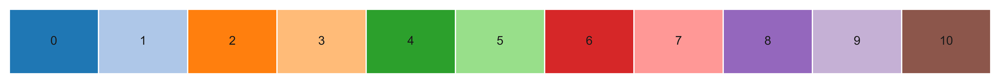

In [56]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)
#plt.savefig("1CTRL_cellType-heatmap-legend-top5.pdf", dpi=600, bbox_inches = "tight")

In [57]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
#plt.savefig("1CTRL_cellType-heatmap-top5.pdf", dpi=600, bbox_inches = "tight")

/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/scenic_env_py310/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, -365.6083333333346, '')

In [58]:
# Select the top regulons
top10reg = auc_mtx_Z.columns[:10]  # Adjust this to select your top regulons

# Aggregate data by cluster
cluster_auc_mtx = auc_mtx_Z[top10reg].groupby(cellAnnot['Clusterings']).mean()

# Plot the heatmap
sns.set(font_scale=1.2)
g = sns.clustermap(cluster_auc_mtx, annot=False, square=False, linecolor='gray',
                   yticklabels=True, xticklabels=True, vmin=-2, vmax=6,
                   cmap="YlGnBu", figsize=(12, 8))

g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('Clusters')
g.ax_heatmap.set_xlabel('Regulons')

# Save the figure
# plt.savefig("1CTRL_cluster-heatmap-top5.pdf", dpi=600, bbox_inches="tight")
plt.show()

In [59]:
selected_motifs = ['ALX3', 'BHLHE22', 'ARNT2', 'BACH1', 'ARID3A', 'BCL6', 'AR', 'ATF3', 'ATF4', 'BPTF']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [60]:
print("Available regulons in auc_mtx_Z:", auc_mtx_Z.columns.tolist())

Available regulons in auc_mtx_Z: ['ALX3(+)', 'AR(+)', 'ARID3A(+)', 'ARNT2(+)', 'ATF3(+)', 'ATF4(+)', 'BACH1(+)', 'BCL6(+)', 'BHLHE22(+)', 'BPTF(+)', 'CEBPA(+)', 'CEBPB(+)', 'CEBPG(+)', 'CEBPZ(+)', 'CREB3(+)', 'CUX1(+)', 'DBP(+)', 'DDIT3(+)', 'DLX1(+)', 'DLX2(+)', 'DRAP1(+)', 'E2F3(+)', 'ELF1(+)', 'ELF2(+)', 'ELK1(+)', 'ELK4(+)', 'ESRRA(+)', 'ESRRG(+)', 'ETS1(+)', 'ETS2(+)', 'ETV5(+)', 'FLI1(+)', 'FOS(+)', 'FOSB(+)', 'FOSL2(+)', 'FOXG1(+)', 'FOXO1(+)', 'GABPA(+)', 'GABPB1(+)', 'GATAD1(+)', 'GLIS3(+)', 'GZF1(+)', 'HCFC1(+)', 'HES1(+)', 'HLTF(+)', 'HMGA1(+)', 'HMGA2(+)', 'HNF1A(+)', 'HNF4A(+)', 'HNF4G(+)', 'IKZF1(+)', 'IKZF2(+)', 'IRF8(+)', 'JUN(+)', 'JUNB(+)', 'JUND(+)', 'KLF10(+)', 'KLF12(+)', 'KLF4(+)', 'LEF1(+)', 'MAFB(+)', 'MAFK(+)', 'MAX(+)', 'MEIS1(+)', 'MGA(+)', 'MITF(+)', 'MTF2(+)', 'NFATC1(+)', 'NFATC2(+)', 'NFE2L1(+)', 'NFIA(+)', 'NFIB(+)', 'NFIC(+)', 'NFIL3(+)', 'NFYA(+)', 'NFYB(+)', 'NKX6-2(+)', 'NR1D1(+)', 'NR2C2(+)', 'NR2F1(+)', 'NR2F2(+)', 'NR3C1(+)', 'NRF1(+)', 'OVOL2(+)'

In [68]:
print("DataFrame columns:", df_motifs.columns)
print("First few rows of the DataFrame:")
print(df_motifs.head())

DataFrame columns: MultiIndex([('Enrichment',                   'AUC'),
            ('Enrichment',                   'NES'),
            ('Enrichment', 'MotifSimilarityQvalue'),
            ('Enrichment',   'OrthologousIdentity'),
            ('Enrichment',            'Annotation'),
            ('Enrichment',               'Context'),
            ('Enrichment',           'TargetGenes'),
            ('Enrichment',             'RankAtMax')],
           )
First few rows of the DataFrame:
                                          Enrichment            \
                                                 AUC       NES   
TF    MotifID                                                    
ATF3  tfdimers__MD00424                     0.062732  3.173859   
ATF4  taipale_tf_pairs__JUN_ATGACGTCAT_HT   0.045077  3.824882   
      metacluster_180.3                     0.041098  3.000634   
      transfac_pro__M00801                  0.041875  3.161556   
BACH1 tfdimers__MD00569                     0.07

In [78]:
# Load the CSV file containing regulon information
file_path1 = 'Data/Velmeshev/1CTRLreg.csv'
df_regulons = pd.read_csv(file_path1, header=[0, 1], index_col=[0, 1])

# Ensure the index is a MultiIndex
if not isinstance(df_regulons.index, pd.MultiIndex):
    df_regulons.set_index(['TF', 'MotifID'], inplace=True)

# Filter the DataFrame to find rows where the TF is 'ETV5'
etv5_regulon = df_regulons.xs('ETV5', level='TF')

# Extract target genes from the 'TargetGenes' column
etv5_target_genes = []
for entry in etv5_regulon[('Enrichment', 'TargetGenes')]:
    # Extract gene names from the list of tuples
    genes = [gene for gene, _ in eval(entry)]  # Use eval to convert string representation of list to actual list
    etv5_target_genes.extend(genes)

# Remove duplicates by converting to a set, then back to a list for the final output
etv5_target_genes = list(set(etv5_target_genes))

# Display the extracted target genes
print("ETV5 Target Genes:", etv5_target_genes)

ARNT2 Target Genes: ['GRID2', 'EPHA6', 'GULP1', 'TTBK2', 'DPP6', 'FNDC3A', 'GALNT7', 'DLGAP1', 'AMD1', 'HS6ST3', 'NDST3', 'JAK1', 'PAM', 'CNTNAP2', 'PCGF5', 'GALNTL6', 'WASF3']


In [79]:
# Convert the list to a newline-separated string
gene_list_for_go = "\n".join(etv5_target_genes)

# Print or save the gene list
print(gene_list_for_go)

# Optionally, save to a file
with open("etv5_target_genes.txt", "w") as file:
    file.write(gene_list_for_go)

GRID2
EPHA6
GULP1
TTBK2
DPP6
FNDC3A
GALNT7
DLGAP1
AMD1
HS6ST3
NDST3
JAK1
PAM
CNTNAP2
PCGF5
GALNTL6
WASF3


In [81]:
import pandas as pd

# Load the CSV file containing regulon information
file_path = 'Data/Velmeshev/1CTRLreg.csv'
df_regulons = pd.read_csv(file_path, header=[0, 1], index_col=[0, 1])

# Ensure the index is a MultiIndex
if not isinstance(df_regulons.index, pd.MultiIndex):
    df_regulons.set_index(['TF', 'MotifID'], inplace=True)

# Filter the DataFrame to find rows where the TF is 'ETV5'
CUX1_regulon = df_regulons.xs('CUX1', level='TF')

# Extract target genes and their expression levels from the 'TargetGenes' column
CUX1_target_genes_with_expression = []
for entry in etv5_regulon[('Enrichment', 'TargetGenes')]:
    # Extract gene names and expression levels from the list of tuples
    genes_with_expression = [(gene, expression) for gene, expression in eval(entry)]  # Use eval to convert string representation of list to actual list
    CUX1_target_genes_with_expression.extend(genes_with_expression)

# Remove duplicates by converting to a set of tuples, then back to a list for the final output
CUX1_target_genes_with_expression = list(set(CUX1_target_genes_with_expression))

# Display the extracted target genes with their expression levels
for gene, expression in CUX1_target_genes_with_expression:
    print(f"Gene: {gene}, Expression Level: {expression}")

Gene: GRM4, Expression Level: 5.276285725537589
Gene: OLFM3, Expression Level: 6.839962758455894
Gene: C14orf79, Expression Level: 5.16361142436191
Gene: CPNE7, Expression Level: 6.790257916836687
Gene: CLEC2L, Expression Level: 6.174430075963119
Gene: LRP2, Expression Level: 7.257551574316984
Gene: ZNF320, Expression Level: 6.639333322506873
Gene: PCDH17, Expression Level: 7.332085294069657
